# dataset clean (1444 x 2 = 2888) 2308 + 580 optimasi hyperparameter + augmentasi elastic transform

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
import cv2
import matplotlib.pyplot as plt
import shutil
import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, array_to_img
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.applications import DenseNet169
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from PIL import Image
from tensorflow.keras.callbacks import ReduceLROnPlateau
from albumentations import ElasticTransform, Compose

C:\Users\ASUS\AppData\Roaming\Python\Python311\site-packages\albumentations\__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
# Lokasi dataset asli
asal_dir = r'..\..\dataset\Dataset 1444'
base_dir = r'..\..\dataset\Dataset Ori + Aug\elastic tansform'
train_dir = r'..\..\dataset\Dataset Ori + Aug\elastic\train'
test_dir = r'..\..\dataset\Dataset Ori + Aug\elastic\test'

# if not os.path.exists(base_dir):
#     os.makedirs(base_dir)

if not os.path.exists(test_dir):
    os.makedirs(test_dir)

if not os.path.exists(train_dir):
    os.makedirs(train_dir)

In [3]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
BATCH_SIZE = 32
COLOR_CHANNELS = 3

In [ ]:
def albumentations_aug(image):
    augment = Compose([ElasticTransform(alpha=120,          # meregangkan atau mengompresi, bergelombang atau melengkung 20-200
                                        sigma=10,           # seberapa mulus atau tajam distorsi yang terjadi 1-10 (semakin kecil semakin tajam)
                                        # alpha_affine=10,    # gambar tidak hanya bergelombang, tetapi juga bisa sedikit bergeser, berotasi, atau berubah ukurannya. 1-10
                                        p=1.0)])            # probabilitas augmentasi diterapkan pada gambar. 1.0: Augmentasi diterapkan di semua gambar input
    augmented = augment(image=image)["image"]
    return augmented


In [ ]:
# # menyalin gambar asal ke base

# # Loop melalui setiap folder 
# for label in os.listdir(asal_dir):
#     label_path = os.path.join(asal_dir, label)
    
#     # Pastikan ini adalah direktori
#     if os.path.isdir(label_path):
#         # Buat direktori label di gabungan_dir jika belum ada
#         gabungan_label_dir = os.path.join(base_dir, label)
#         if not os.path.exists(gabungan_label_dir):
#             os.makedirs(gabungan_label_dir)
        
#         # Loop melalui setiap gambar di folder label
#         for image_name in os.listdir(label_path):
#             image_path = os.path.join(label_path, image_name)
            
#             # Salin gambar ke direktori gabungan
#             shutil.copy(image_path, gabungan_label_dir)

# print("Semua gambar dari telah disalin")

Semua gambar dari telah disalin


In [ ]:
# # Menambahkan dataset augmentasi di lokal

# datagen_aug = ImageDataGenerator(
#     preprocessing_function=albumentations_aug,
# )

# for label in os.listdir(base_dir):
#     label_path = os.path.join(base_dir, label)
    
#     if os.path.isdir(label_path):
#         for file in os.listdir(label_path):
#             img_path = os.path.join(label_path, file)

#             # Load gambar
#             img = load_img(img_path)
#             img_array = img_to_array(img)
#             img_array = np.expand_dims(img_array, axis=0)

#             # Hasil augmentasi
#             aug_iter = datagen_aug.flow(img_array, batch_size=1)

#             for i in range(1):
#                 aug_img = next(aug_iter)[0].astype(np.uint8)
#                 aug_img_pil = array_to_img(aug_img)

#                 # Simpan gambar hasil augmentasi di lokasi asli
#                 save_path = os.path.join(label_path, f'aug_{file}')
#                 aug_img_pil.save(save_path)

# print("Augmentasi selesai dan gambar berhasil disimpan.")

Jumlah data Kawung: 722
Jumlah data Mega Mendung: 722
Jumlah data Parang: 722
Jumlah data Truntum: 722
Jumlah Dataset Rotate: 2888


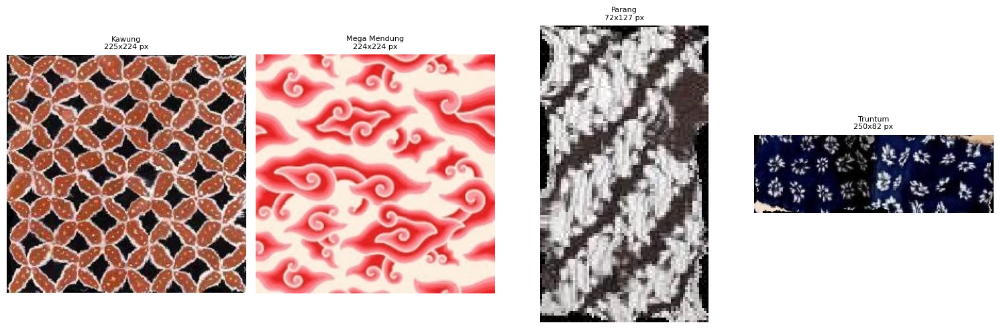

In [ ]:
## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
dataset = base_dir
folders = [folder for folder in os.listdir(dataset) if os.path.isdir(os.path.join(dataset, folder))]
# Check if folders is empty and handle it
if not folders:
    print("No folders found in the dataset directory. Please check the path.")
else:
    fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))

    for i, folder in enumerate(folders):
        folder_path = os.path.join(dataset, folder)
        image_count = len(os.listdir(folder_path))
        total_dataset += image_count
        print(f"Jumlah data {folder}: {image_count}")

        # Menampilkan foto secara acak dari setiap folder
        try:
            image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
            if image_files:
                random_image = random.choice(image_files)
                image_path = os.path.join(folder_path, random_image)
                img = Image.open(image_path)
                width, height = img.size

                # Menampilkan gambar di subplot horizontal
                axes[i].imshow(img)
                axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
                axes[i].axis('off')
            else:
                print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
        except Exception as e:
            print(f"Error menampilkan gambar dari folder '{folder}': {e}")

    print(f"Jumlah Dataset Rotate: {total_dataset}")
    plt.tight_layout()
    plt.show()

In [ ]:
# # Membagi data train dan test setelah augmentasi data

# # Membuat folder untuk data train dan test jika belum ada
# os.makedirs(train_dir, exist_ok=True)
# os.makedirs(test_dir, exist_ok=True)

# # Mendapatkan daftar kelas (subfolder dalam dataset)
# classes = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

# # Membagi data per kelas
# for cls in classes:
#     cls_path = os.path.join(base_dir, cls)

#     # Membuat folder kelas di train dan test
#     os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
#     os.makedirs(os.path.join(test_dir, cls), exist_ok=True)

#     # Mendapatkan daftar file gambar dalam kelas
#     images = os.listdir(cls_path)

#     # Membagi gambar menjadi 80% train dan 20% test
#     train_imgs, test_imgs = train_test_split(images, test_size=0.2, random_state=42)

#     # Memindahkan file ke folder train dan test
#     for img in train_imgs:
#         shutil.move(os.path.join(cls_path, img), os.path.join(train_dir, cls, img))
#     for img in test_imgs:
#         shutil.move(os.path.join(cls_path, img), os.path.join(test_dir, cls, img))

# print("Pembagian dataset selesai.")

Pembagian dataset selesai.


Jumlah data Kawung: 145
Jumlah data Mega Mendung: 145
Jumlah data Parang: 145
Jumlah data Truntum: 145
Jumlah Dataset Rotate: 580


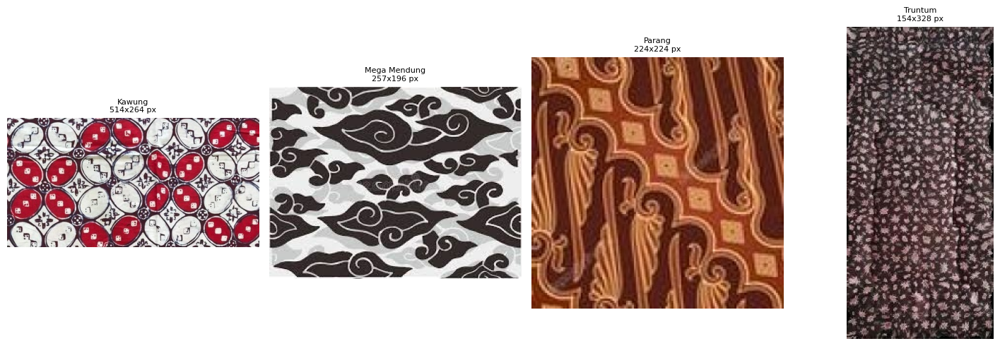

In [6]:
## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
dataset = test_dir
folders = [folder for folder in os.listdir(dataset) if os.path.isdir(os.path.join(dataset, folder))]
# Check if folders is empty and handle it
if not folders:
    print("No folders found in the dataset directory. Please check the path.")
else:
    fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))

    for i, folder in enumerate(folders):
        folder_path = os.path.join(dataset, folder)
        image_count = len(os.listdir(folder_path))
        total_dataset += image_count
        print(f"Jumlah data {folder}: {image_count}")

        # Menampilkan foto secara acak dari setiap folder
        try:
            image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
            if image_files:
                random_image = random.choice(image_files)
                image_path = os.path.join(folder_path, random_image)
                img = Image.open(image_path)
                width, height = img.size

                # Menampilkan gambar di subplot horizontal
                axes[i].imshow(img)
                axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
                axes[i].axis('off')
            else:
                print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
        except Exception as e:
            print(f"Error menampilkan gambar dari folder '{folder}': {e}")

    print(f"Jumlah Dataset Rotate: {total_dataset}")
    plt.tight_layout()
    plt.show()

In [4]:
# Fungsi preprocessing menggunakan CLAHE
# CLAHE akan meningkatkan kontras gambar sehingga fitur lebih terlihat
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
def preprocess_image(image):
    # Konversi nilai dari 0-1 ke 0-255 dan ubah tipe data ke uint8
    image = (image * 255).astype(np.uint8)
    
    # Konversi ke LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    # Pisahkan channel L, A, dan B
    l, a, b = cv2.split(lab)
    
    # Terapkan CLAHE pada channel L (grayscale)
    l = clahe.apply(l)
    
    # Gabungkan kembali ke LAB
    lab = cv2.merge((l, a, b))
    
    # Konversi kembali ke RGB
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # Normalisasi kembali ke 0-1
    image = image / 255.0

    return image

In [8]:
# Ambil semua file gambar dari dataset asli
file_paths = []
labels = []

# Ambil file dari train_dir (data asli)
for label in os.listdir(train_dir):
    label_path = os.path.join(train_dir, label)
    if os.path.isdir(label_path):
        for file in os.listdir(label_path):
            file_paths.append(os.path.join(label_path, file))
            labels.append(label)

# Map label ke integer
unique_labels = sorted(set(labels))
label_map = {label: idx for idx, label in enumerate(unique_labels)}
integer_labels = [label_map[label] for label in labels]

print(f"Jumlah total gambar: {len(file_paths)}")
print(len(unique_labels))
print(label_map)
print(integer_labels)

Jumlah total gambar: 2308
4
{'Kawung': 0, 'Mega Mendung': 1, 'Parang': 2, 'Truntum': 3}
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [5]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_image
)

test_generator = datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

Found 580 images belonging to 4 classes.


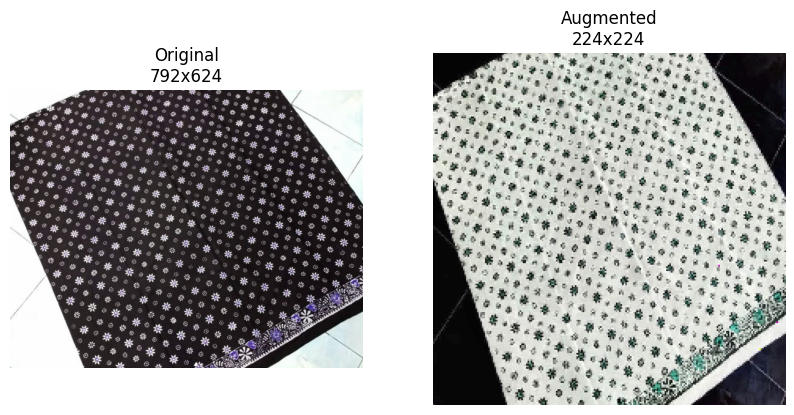

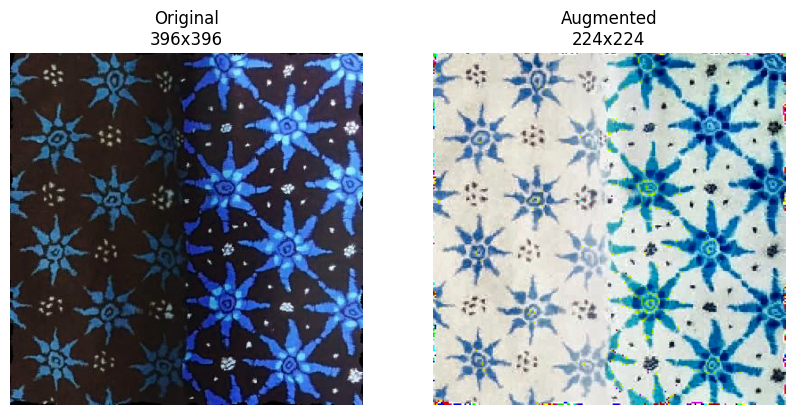

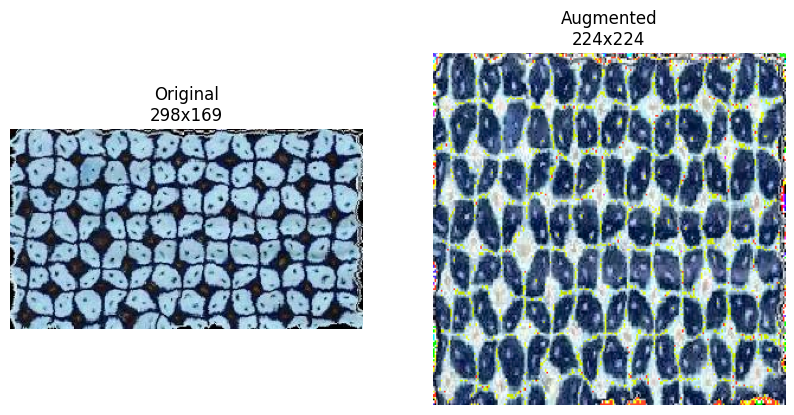

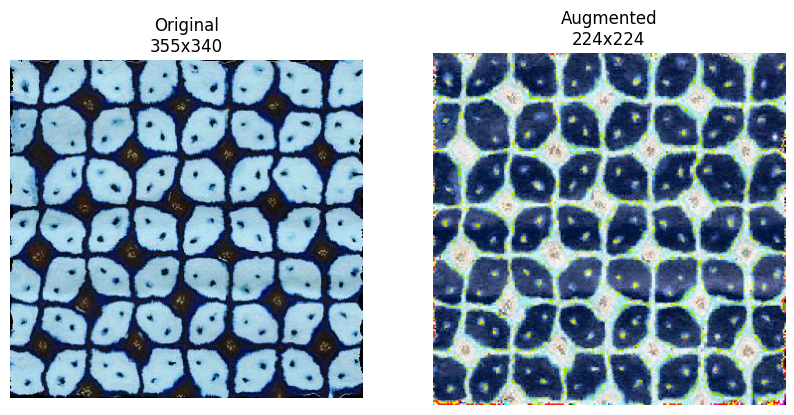

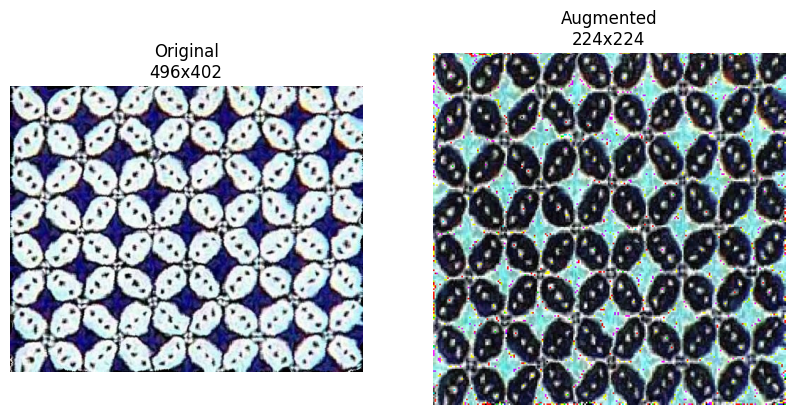

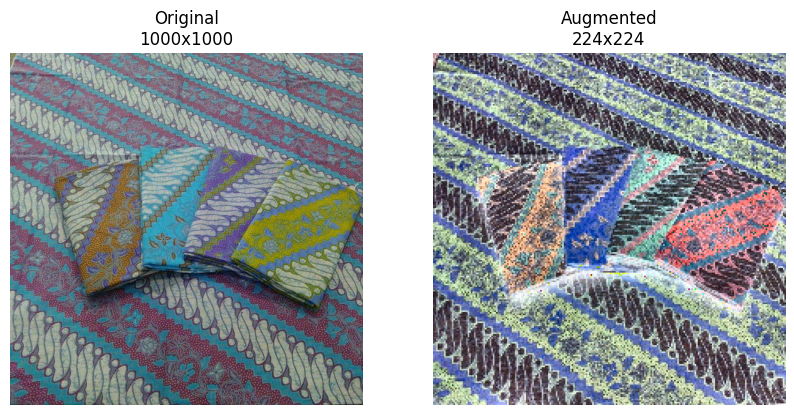

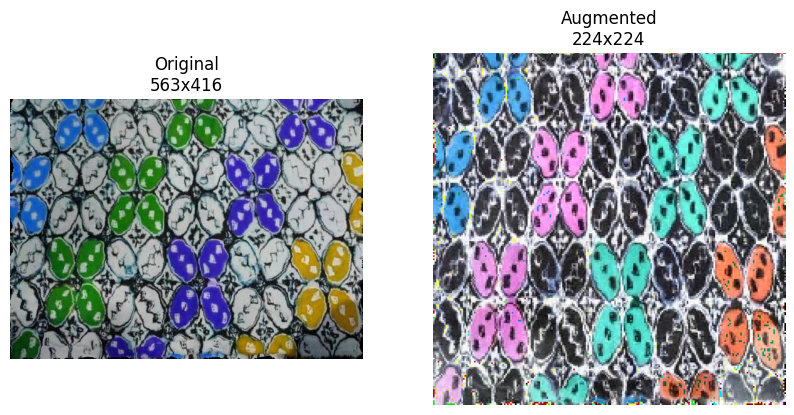

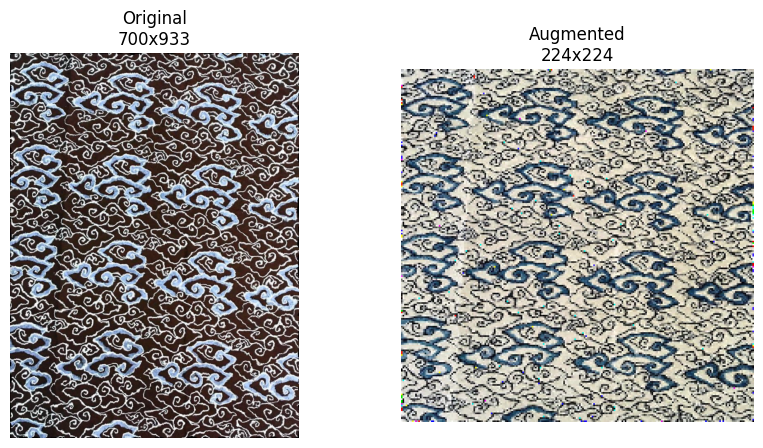

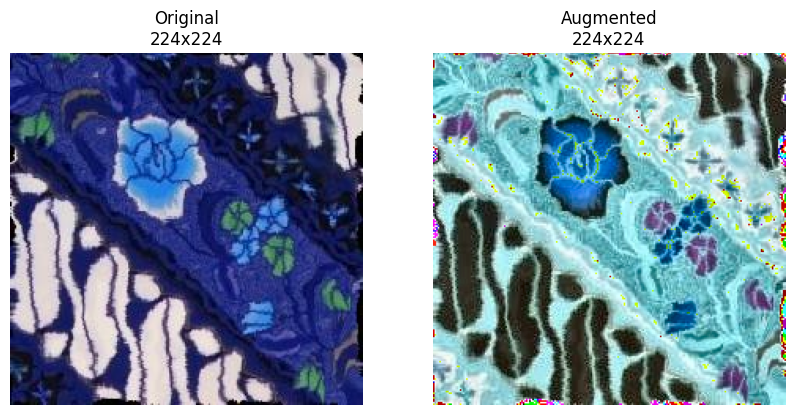

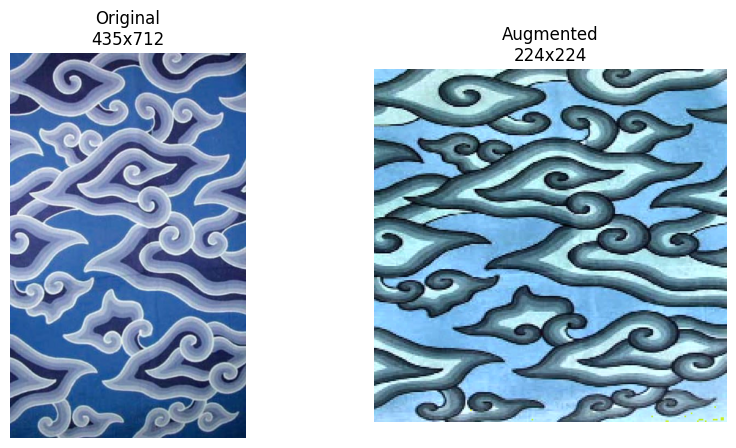

In [36]:
# Ambil satu batch gambar dari test generator
images, labels = next(test_generator)

# Tampilkan 5 gambar asli dan gambar yang telah diproses
for i in range(10):
    # Ambil path gambar asli
    img_path = test_generator.filepaths[test_generator.index_array[i]]
    
    # Baca gambar asli menggunakan OpenCV
    original_image = cv2.imread(img_path)

    # Ambil gambar yang telah diproses oleh test_generator
    augmented_image = images[i]

    # Dapatkan dimensi gambar
    height_original, width_original, _ = original_image.shape
    height_augmented, width_augmented, _ = augmented_image.shape

    # Tampilkan gambar asli dan gambar yang telah diproses
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    # Tampilkan gambar asli
    axes[0].imshow(original_image)
    axes[0].set_title(f"Original\n{width_original}x{height_original}")
    axes[0].axis("off")

    # Tampilkan gambar yang telah diproses
    axes[1].imshow(augmented_image)
    axes[1].set_title(f"Augmented\n{width_augmented}x{height_augmented}")
    axes[1].axis("off")

    plt.show()

# coba

In [39]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_image,
    validation_split=0.2,
)

train_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

Found 1848 images belonging to 4 classes.
Found 460 images belonging to 4 classes.


Found 1848 images belonging to 4 classes.
Found 460 images belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 237s 4s/step - accuracy: 0.4329 - loss: 1.3456 - val_accuracy: 0.8565 - val_loss: 0.5617 - learning_rate: 1.0000e-04
Epoch 2/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 167s 3s/step - accuracy: 0.6858 - loss: 0.7417 - val_accuracy: 0.9283 - val_loss: 0.2929 - learning_rate: 1.0000e-04
Epoch 3/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 168s 3s/step - accuracy: 0.8313 - loss: 0.4762 - val_accuracy: 0.9457 - val_loss: 0.1851 - learning_rate: 1.0000e-04
Epoch 4/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 170s 3s/step - accuracy: 0.8839 - loss: 0.3326 - val_accuracy: 0.9543 - val_loss: 0.1277 - learning_rate: 1.0000e-04
Epoch 5/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.9183 - loss: 0.2354 - val_accuracy: 0.9696 - val_loss: 0.0948 - learning_rate: 1.0000e-04
Epoch 6/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9313 - loss: 0.1942 - val_accuracy: 0.9696 - val_loss: 0.0768 - learning_rate: 1.0000e-04
Epoch 7/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 157s 3s/step - accuracy: 0.9572 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_17172\3010047983.py:98: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_17172\3010047983.py:107: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


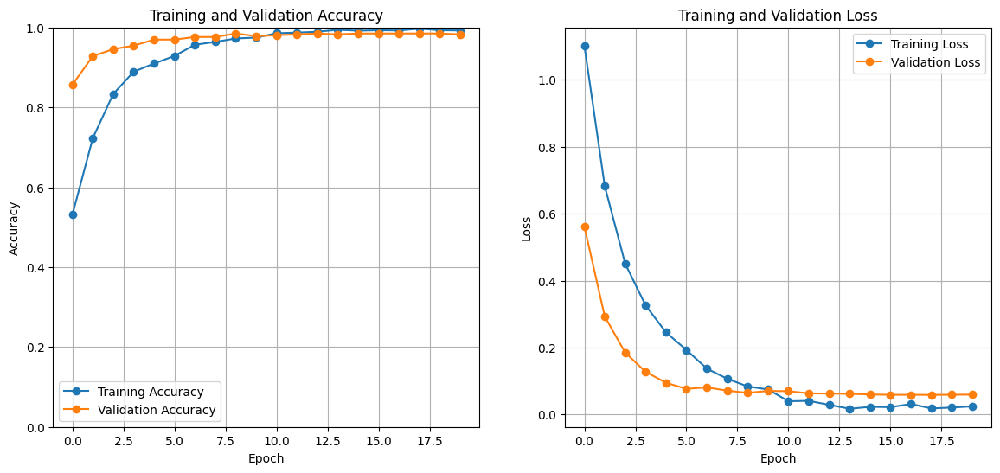

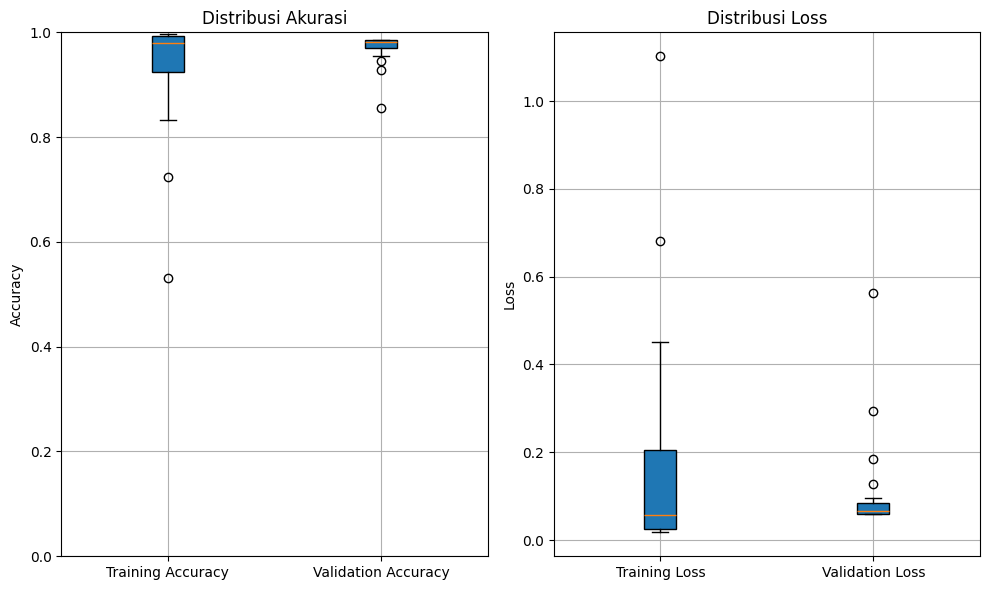

In [ ]:
def create_model(num_classes):
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))

    for layer in base_model.layers[:-10]:  # Membekukan semua kecuali 10 lapisan terakhir
        layer.trainable = False 

    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=RMSprop(0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    # model.summary()
    return model

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras aug\elastic' # Mendefinisikan best_model_dir di luar fungsi
os.makedirs(best_model_dir, exist_ok=True)

 # Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'Elastic_Model.keras'), monitor='val_loss', save_best_only=True)

# Buat Learning Rate Scheduler
lr_scheduler =  ReduceLROnPlateau(
    monitor='val_accuracy',     
    factor=0.1,             
    patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
    min_lr=1e-6,            
    verbose=1               
)

num_classes = 4 # atau bagaimanapun Anda menentukan jumlah kelas
model = create_model(num_classes) # Panggil fungsi create_model dengan jumlah kelas yang benar

train_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

# Training model tanpa KFold
EPOCHS = 20  # Ubah jumlah epoch menjadi 10
history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=[early_stopping, model_checkpoint, lr_scheduler]
)

# Plot grafik akurasi dan loss dengan format yang lebih baik
plt.figure(figsize=(14, 6))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
plt.grid(True)
plt.legend()

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Buat figure Box Plot
plt.figure(figsize=(10, 6))

# Boxplot untuk Training & Validation Accuracy
plt.subplot(1, 2, 1)
plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
            labels=['Training Accuracy', 'Validation Accuracy'])
plt.title('Distribusi Akurasi')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.grid(True)

# Boxplot untuk Training & Validation Loss
plt.subplot(1, 2, 2)
plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
            labels=['Training Loss', 'Validation Loss'])
plt.title('Distribusi Loss')
plt.ylabel('Loss')
plt.grid(True)

# Tampilkan grafik
plt.tight_layout()
plt.show()

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step


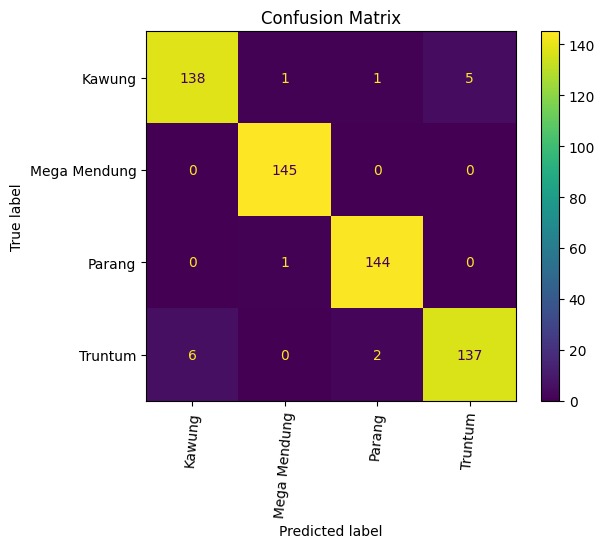

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9583    0.9517    0.9550       145
Mega Mendung     0.9864    1.0000    0.9932       145
      Parang     0.9796    0.9931    0.9863       145
     Truntum     0.9648    0.9448    0.9547       145

    accuracy                         0.9724       580
   macro avg     0.9723    0.9724    0.9723       580
weighted avg     0.9723    0.9724    0.9723       580



In [49]:
loaded_model = load_model('./keras aug/elastic/Elastic_Model.keras')

predictions = loaded_model.predict(test_generator)

  # Get class labels
class_labels = list(test_generator.class_indices.keys())

  # Get the true class indices
true_class_indices = test_generator.classes

  # Get the predicted class indices
predicted_class_indices = np.argmax(predictions, axis=1)

  # Map predicted class indices to the actual class labels
predicted_labels = [class_labels[idx] for idx in predicted_class_indices]

  # Calculate the prediction confidence for each image
prediction_confidences = np.max(predictions, axis=1)

y_true = test_generator.classes
y_pred = np.argmax(predictions, axis=1)

# Confusion Matrix Display
conf_matrix = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)

disp.plot(cmap='viridis')
plt.title('Confusion Matrix')
plt.xticks(rotation=85)
plt.show()

class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
print('Classification Report')
print(class_report)


# Kfold


🚀 Training Fold 1 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,498,020 (51.49 MB)

 Trainable params: 1,107,748 (4.23 MB)

 Non-trainable params: 12,390,272 (47.27 MB)

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 281s 4s/step - accuracy: 0.4574 - loss: 1.3153 - val_accuracy: 0.8853 - val_loss: 0.4338 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 184s 3s/step - accuracy: 0.7780 - loss: 0.5838 - val_accuracy: 0.9026 - val_loss: 0.2867 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.8588 - loss: 0.3683 - val_accuracy: 0.9502 - val_loss: 0.1578 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.8905 - loss: 0.2789 - val_accuracy: 0.9545 - val_loss: 0.1503 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - accuracy: 0.9383 - loss: 0.1921 - val_accuracy: 0.9697 - val_loss: 0.0949 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 144s 2s/step - accuracy: 0.9623 - loss: 0.1168 - val_accuracy: 0.9697 - val_loss: 0.0792 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - accuracy: 0.9550 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


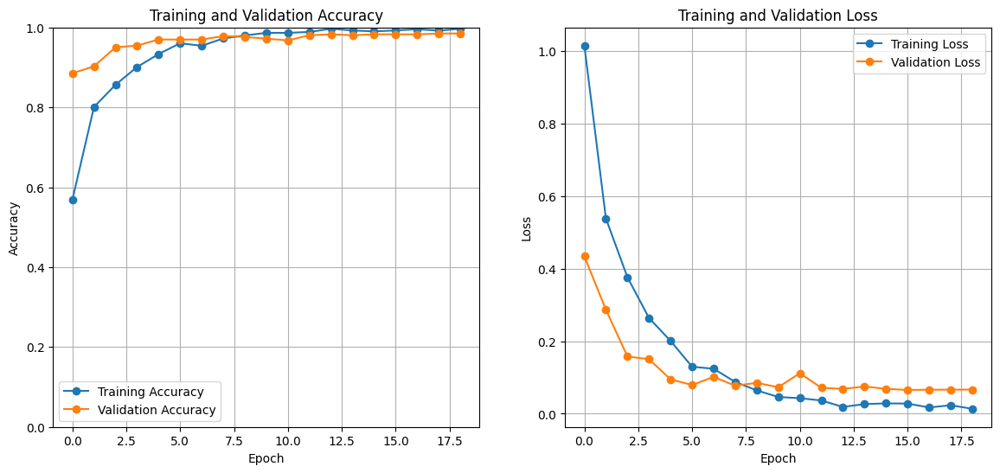

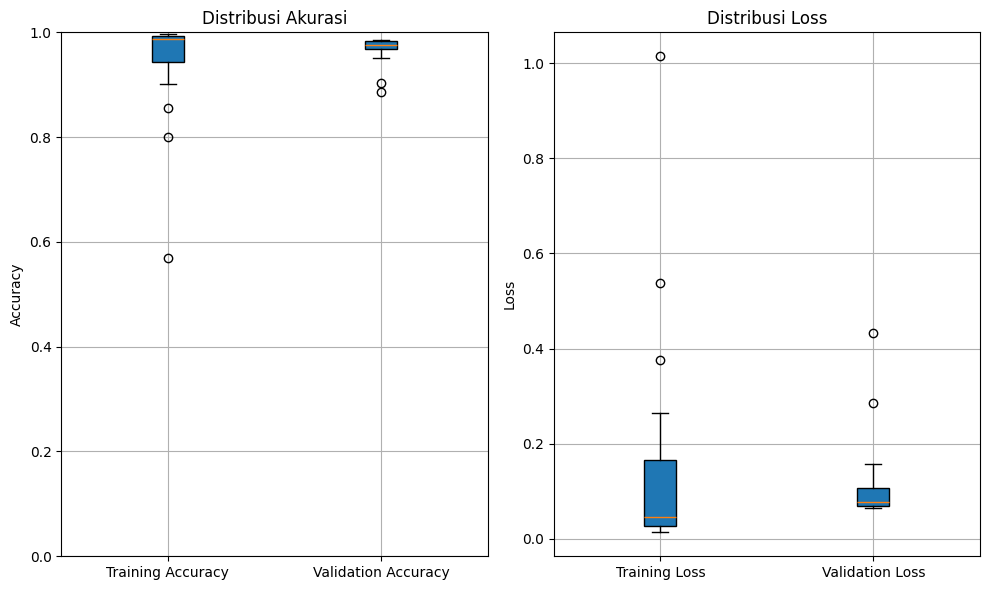


🚀 Training Fold 2 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,498,020 (51.49 MB)

 Trainable params: 1,107,748 (4.23 MB)

 Non-trainable params: 12,390,272 (47.27 MB)

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 181s 3s/step - accuracy: 0.4260 - loss: 1.3880 - val_accuracy: 0.8506 - val_loss: 0.5395 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 159s 3s/step - accuracy: 0.6971 - loss: 0.7395 - val_accuracy: 0.9091 - val_loss: 0.3288 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 164s 3s/step - accuracy: 0.8177 - loss: 0.4877 - val_accuracy: 0.9372 - val_loss: 0.2114 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 153s 3s/step - accuracy: 0.8534 - loss: 0.3752 - val_accuracy: 0.9416 - val_loss: 0.2023 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9058 - loss: 0.2650 - val_accuracy: 0.9524 - val_loss: 0.1533 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 157s 3s/step - accuracy: 0.9425 - loss: 0.1716 - val_accuracy: 0.9545 - val_loss: 0.1654 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 157s 3s/step - accuracy: 0.9437 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


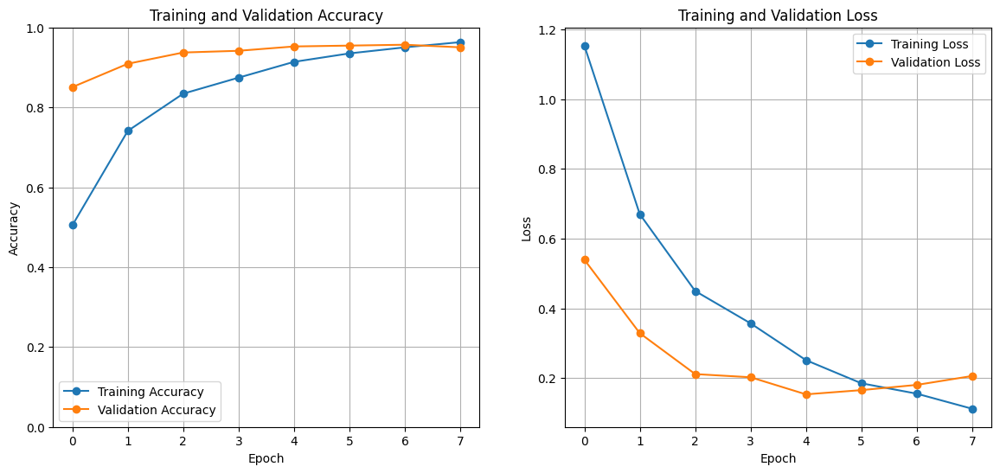

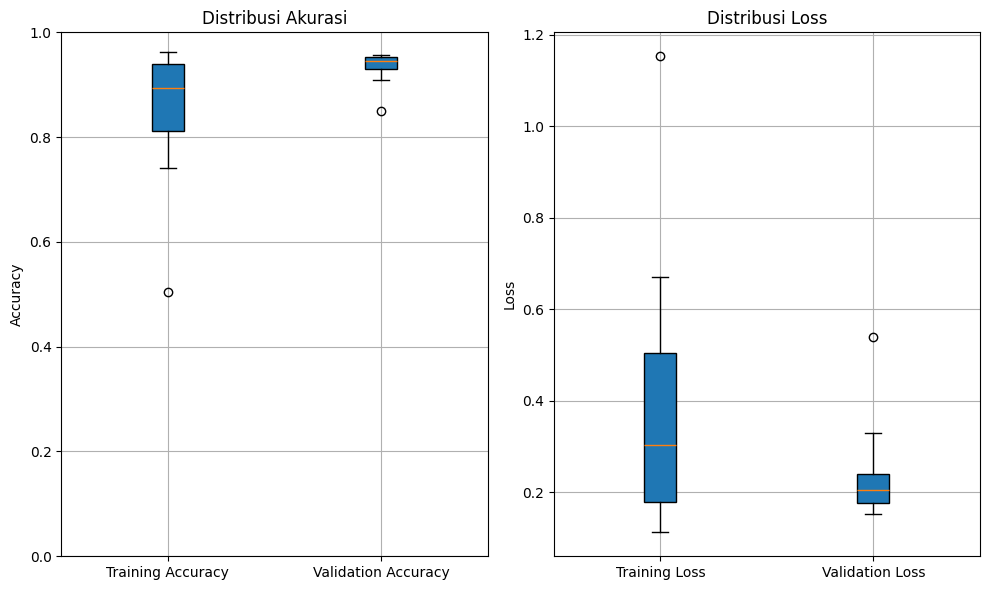


🚀 Training Fold 3 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,498,020 (51.49 MB)

 Trainable params: 1,107,748 (4.23 MB)

 Non-trainable params: 12,390,272 (47.27 MB)

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 181s 3s/step - accuracy: 0.4265 - loss: 1.3810 - val_accuracy: 0.8571 - val_loss: 0.6101 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 157s 3s/step - accuracy: 0.6936 - loss: 0.7850 - val_accuracy: 0.9177 - val_loss: 0.3461 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 153s 3s/step - accuracy: 0.8052 - loss: 0.5383 - val_accuracy: 0.9134 - val_loss: 0.2832 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 152s 3s/step - accuracy: 0.8674 - loss: 0.3805 - val_accuracy: 0.9307 - val_loss: 0.2017 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 151s 3s/step - accuracy: 0.9034 - loss: 0.2882 - val_accuracy: 0.9459 - val_loss: 0.1438 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 150s 3s/step - accuracy: 0.9230 - loss: 0.2125 - val_accuracy: 0.9545 - val_loss: 0.1454 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 151s 3s/step - accuracy: 0.9375 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


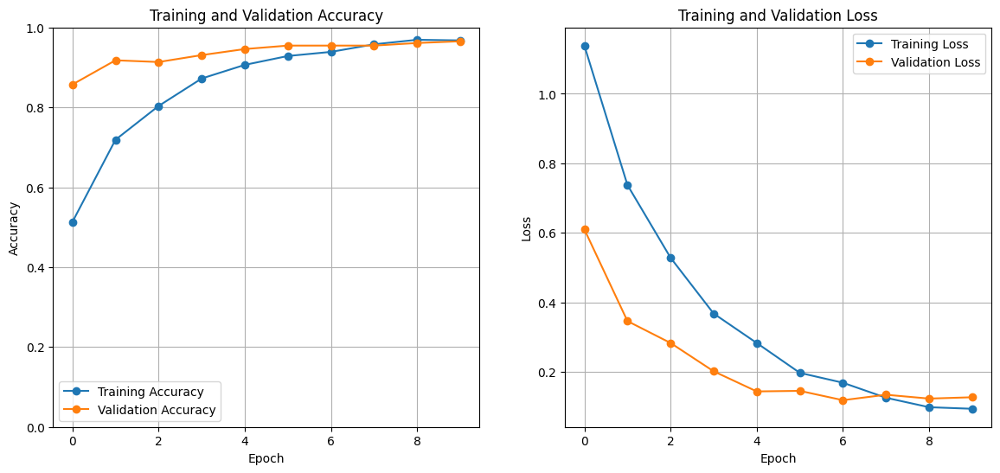

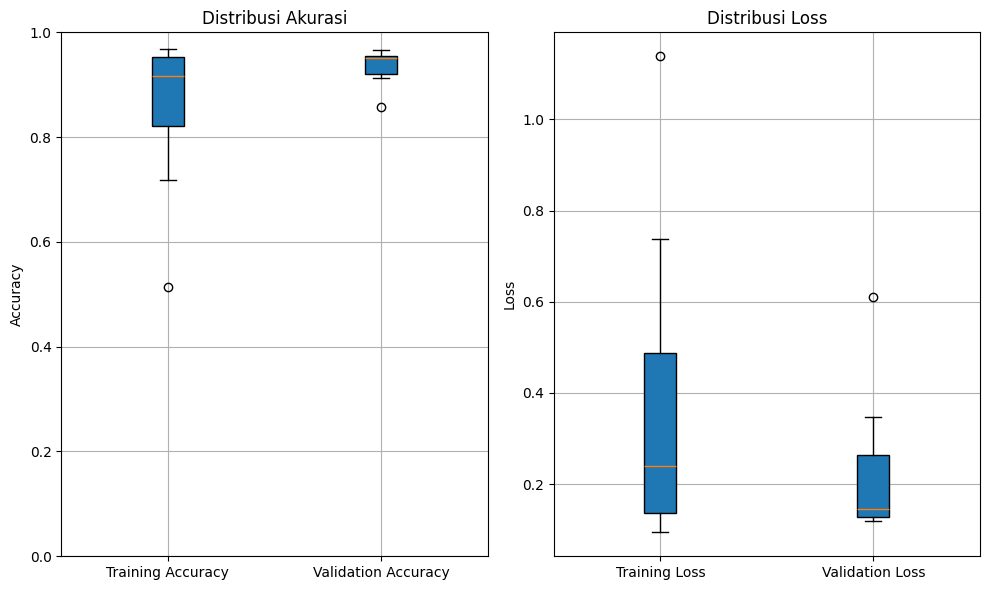


🚀 Training Fold 4 😌

Found 1847 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_6    │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_6… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_7    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_7… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,498,020 (51.49 MB)

 Trainable params: 1,107,748 (4.23 MB)

 Non-trainable params: 12,390,272 (47.27 MB)

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 192s 3s/step - accuracy: 0.4157 - loss: 1.4044 - val_accuracy: 0.8416 - val_loss: 0.6148 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.7121 - loss: 0.7425 - val_accuracy: 0.8872 - val_loss: 0.3679 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.7867 - loss: 0.5371 - val_accuracy: 0.9176 - val_loss: 0.2680 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 167s 3s/step - accuracy: 0.8765 - loss: 0.3480 - val_accuracy: 0.9284 - val_loss: 0.2166 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 164s 3s/step - accuracy: 0.8955 - loss: 0.2765 - val_accuracy: 0.9371 - val_loss: 0.1904 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9292 - loss: 0.2089 - val_accuracy: 0.9479 - val_loss: 0.1388 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - accuracy: 0.9423 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


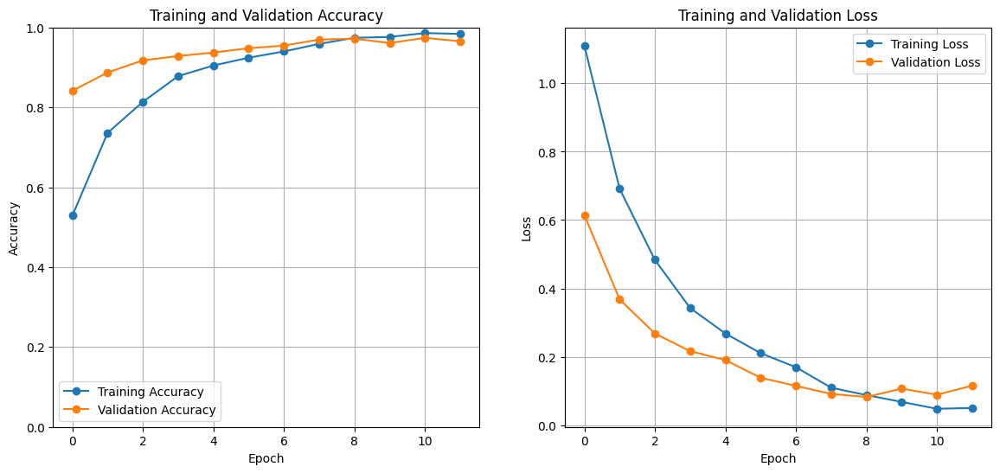

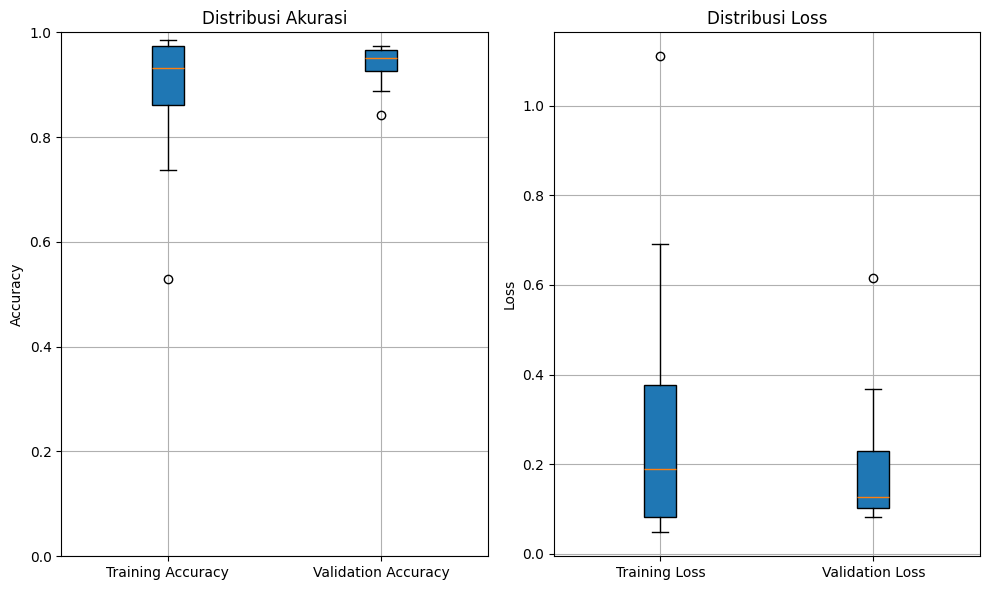


🚀 Training Fold 5 😌

Found 1847 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_8    │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_8… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_9    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_9… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,498,020 (51.49 MB)

 Trainable params: 1,107,748 (4.23 MB)

 Non-trainable params: 12,390,272 (47.27 MB)

c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 177s 3s/step - accuracy: 0.3823 - loss: 1.5027 - val_accuracy: 0.8677 - val_loss: 0.6364 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - accuracy: 0.7209 - loss: 0.7206 - val_accuracy: 0.9219 - val_loss: 0.3464 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - accuracy: 0.8255 - loss: 0.4705 - val_accuracy: 0.9414 - val_loss: 0.2350 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - accuracy: 0.8605 - loss: 0.3634 - val_accuracy: 0.9479 - val_loss: 0.1735 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - accuracy: 0.9047 - loss: 0.2465 - val_accuracy: 0.9610 - val_loss: 0.1299 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - accuracy: 0.9234 - loss: 0.2066 - val_accuracy: 0.9588 - val_loss: 0.1068 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - accuracy: 0.9568 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13488\1682941576.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


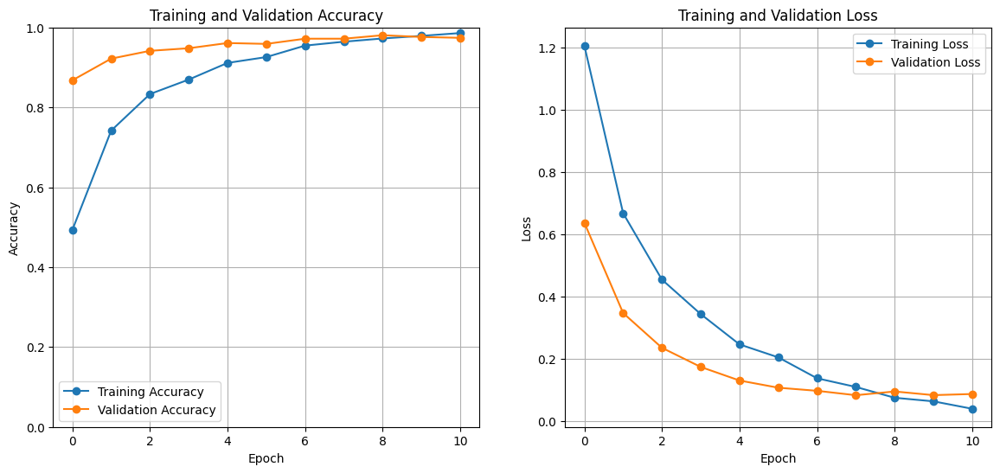

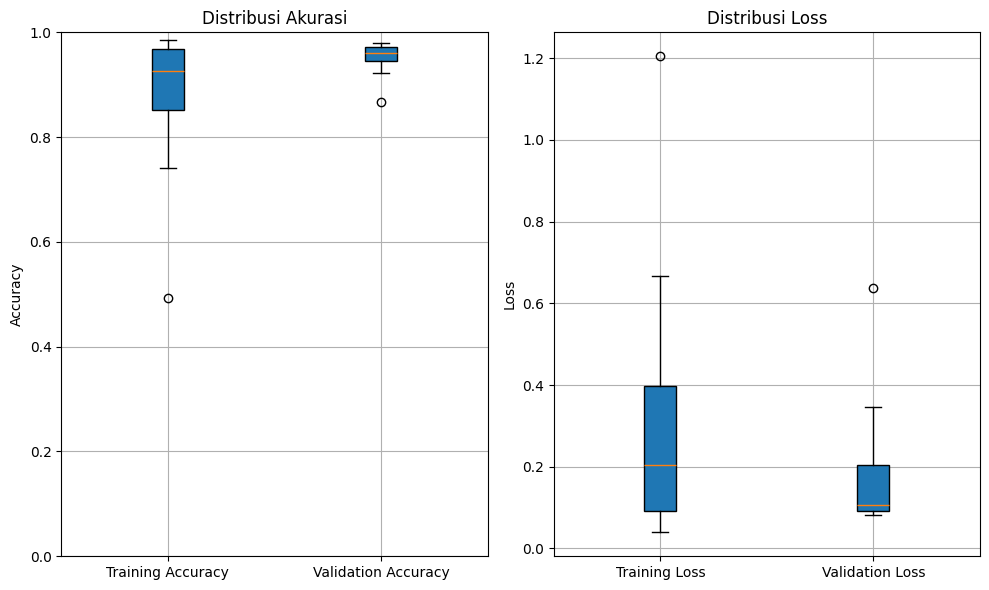

In [10]:
# Implementasi Kfold
EPOCH = 25
kf = KFold(n_splits=5, shuffle=True, random_state=42) # tambahkan random_state untuk reproduksibilitas

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras aug\elastic'
# Fungsi untuk membuat model
def create_model(num_classes):
    base_model = DenseNet169(
        weights='imagenet', 
        include_top=False, 
        input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))
    
    # Membekukan 596 layer awal dari DenseNet169
    for layer in base_model.layers[:-10]:  
        layer.trainable = False

    # Custom Layer base model
    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    model.summary()
    return model

fold_var = 1 # Inisialisasi variabel fold
for train_index, val_index in kf.split(file_paths):
    print(f"\n🚀 Training Fold {fold_var} 😌\n")

    # Split train and validation sets
    train_files, val_files = np.array(file_paths)[train_index], np.array(file_paths)[val_index]
    train_labels, val_labels = np.array(integer_labels)[train_index], np.array(integer_labels)[val_index]
    
    # Convert integer labels to class names
    df_train = pd.DataFrame({"filename": train_files, "class": [unique_labels[i] for i in train_labels]})
    df_val = pd.DataFrame({"filename": val_files, "class": [unique_labels[i] for i in val_labels]})

    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,       # DataFrame yang berisi informasi gambar (filename dan class)
        x_col="filename",         # Kolom yang berisi path ke gambar
        y_col="class",            # Kolom yang berisi label kelas gambar
        target_size=IMAGE_SIZE,   # Ukuran gambar yang akan diubah sebelum masuk ke model
        batch_size=BATCH_SIZE,    # Jumlah gambar yang akan diproses dalam satu batch
        class_mode="categorical", # Mode klasifikasi (multikategori)
        color_mode="rgb",         # Format warna gambar (RGB)
        shuffle=True
    )
    
    val_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col="filename",
        y_col="class",
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        color_mode="rgb",
        shuffle=True
    )

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
    model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'elastic_model_{fold_var}.keras'), monitor='val_loss', save_best_only=True)
    
    # Buat Learning Rate Scheduler
    lr_scheduler = ReduceLROnPlateau(
        monitor='val_accuracy',     
        factor=0.1,             
        patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
        min_lr=1e-6,            
        verbose=1               
    )

    num_classes = 4 
    model = create_model(num_classes)

    # Training Model
    history = model.fit(
        train_generator,
        epochs=EPOCH,
        validation_data=val_generator,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    # Plot grafik akurasi dan loss dengan format yang lebih baik
    plt.figure(figsize=(14, 6))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
    plt.grid(True)
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()

    # Buat figure Box Plot
    plt.figure(figsize=(10, 6))
    
    # Boxplot untuk Training & Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
                labels=['Training Accuracy', 'Validation Accuracy'])
    plt.title('Distribusi Akurasi')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.grid(True)
    
    # Boxplot untuk Training & Validation Loss
    plt.subplot(1, 2, 2)
    plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
                labels=['Training Loss', 'Validation Loss'])
    plt.title('Distribusi Loss')
    plt.ylabel('Loss')
    plt.grid(True)

    # Tampilkan grafik
    plt.tight_layout()
    plt.show()

    fold_var += 1

In [1]:
import numpy as np

# Contoh hasil akurasi dari 5 fold
accuracies = [98.27, 95.24, 95.45, 97.18, 97.18]

# Menghitung standar deviasi
std_dev = np.std(accuracies)

print(f"Standar Deviasi Akurasi Model P2: {std_dev:.4f}")

Standar Deviasi Akurasi Model P2: 1.1501


# testing




Kfold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step


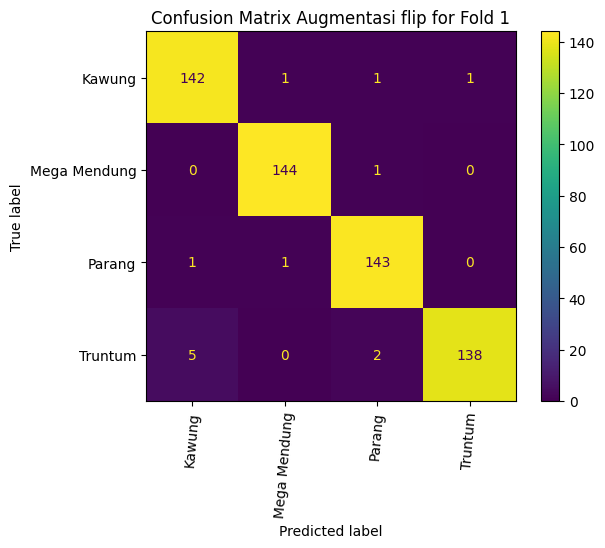

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9595    0.9793    0.9693       145
Mega Mendung     0.9863    0.9931    0.9897       145
      Parang     0.9728    0.9862    0.9795       145
     Truntum     0.9928    0.9517    0.9718       145

    accuracy                         0.9776       580
   macro avg     0.9778    0.9776    0.9776       580
weighted avg     0.9778    0.9776    0.9776       580




Kfold 2 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step


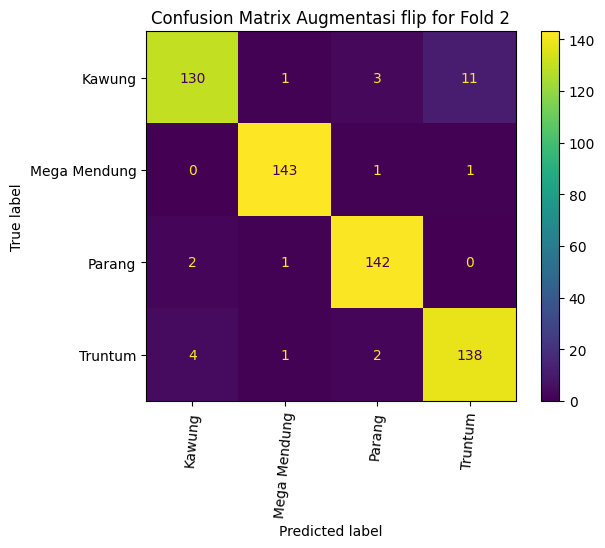

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9559    0.8966    0.9253       145
Mega Mendung     0.9795    0.9862    0.9828       145
      Parang     0.9595    0.9793    0.9693       145
     Truntum     0.9200    0.9517    0.9356       145

    accuracy                         0.9534       580
   macro avg     0.9537    0.9534    0.9532       580
weighted avg     0.9537    0.9534    0.9532       580




Kfold 3 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step


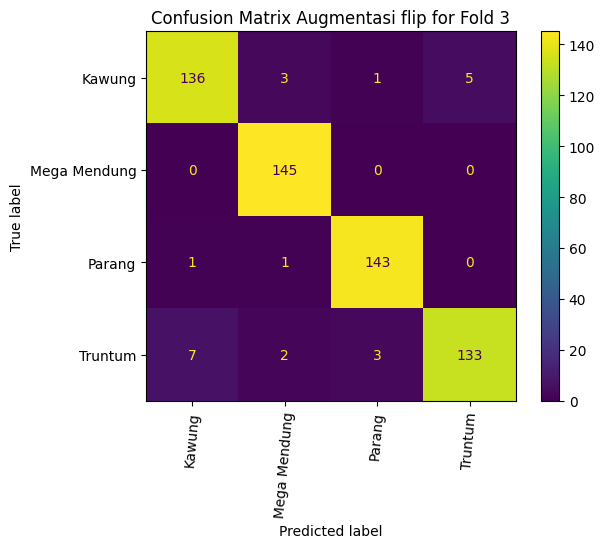

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9444    0.9379    0.9412       145
Mega Mendung     0.9603    1.0000    0.9797       145
      Parang     0.9728    0.9862    0.9795       145
     Truntum     0.9638    0.9172    0.9399       145

    accuracy                         0.9603       580
   macro avg     0.9603    0.9603    0.9601       580
weighted avg     0.9603    0.9603    0.9601       580




Kfold 4 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 55s 3s/step


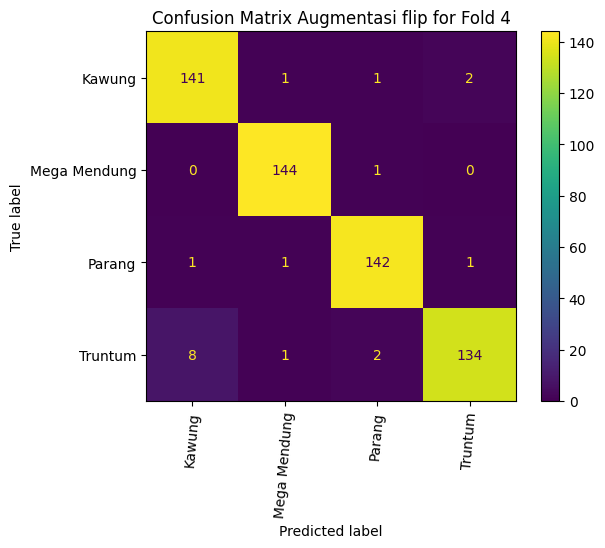

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9400    0.9724    0.9559       145
Mega Mendung     0.9796    0.9931    0.9863       145
      Parang     0.9726    0.9793    0.9759       145
     Truntum     0.9781    0.9241    0.9504       145

    accuracy                         0.9672       580
   macro avg     0.9676    0.9672    0.9671       580
weighted avg     0.9676    0.9672    0.9671       580




Kfold 5 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 55s 3s/step


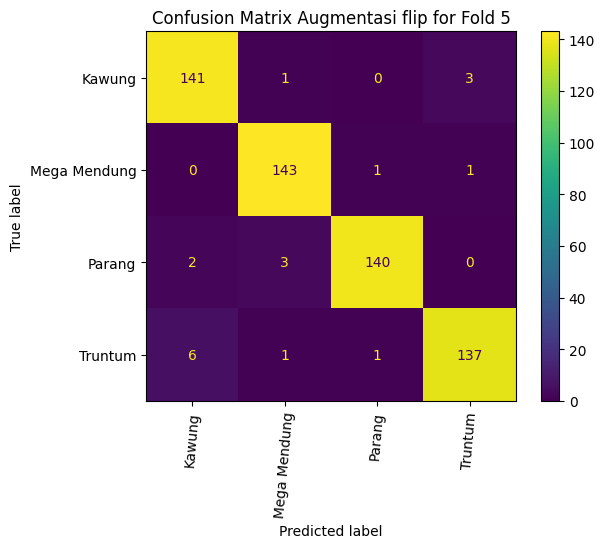

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9463    0.9724    0.9592       145
Mega Mendung     0.9662    0.9862    0.9761       145
      Parang     0.9859    0.9655    0.9756       145
     Truntum     0.9716    0.9448    0.9580       145

    accuracy                         0.9672       580
   macro avg     0.9675    0.9672    0.9672       580
weighted avg     0.9675    0.9672    0.9672       580



In [6]:
def evaluate_model(fold_count, test_generator, model_path='./keras aug/elastic/elastic_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Kfold {fold} ...")
        loaded_model = load_model(f'{model_path}{fold}.keras')
        
        predictions = loaded_model.predict(test_generator)
        
        # Get class labels
        class_labels = list(test_generator.class_indices.keys())
        
        # Get the true and predicted class indices
        y_true = test_generator.classes
        y_pred = np.argmax(predictions, axis=1)
        
        # Confusion Matrix Display
        conf_matrix = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
        
        disp.plot(cmap='viridis')
        plt.title(f'Confusion Matrix Augmentasi flip for Fold {fold}')
        plt.xticks(rotation=85)
        plt.show()
        
        class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
        print('Classification Report')
        print(class_report)

evaluate_model(fold_count=5, test_generator=test_generator)




Evaluasi KFold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 63s 3s/step
Skor AUC (macro-average) untuk Fold 1: 0.9956


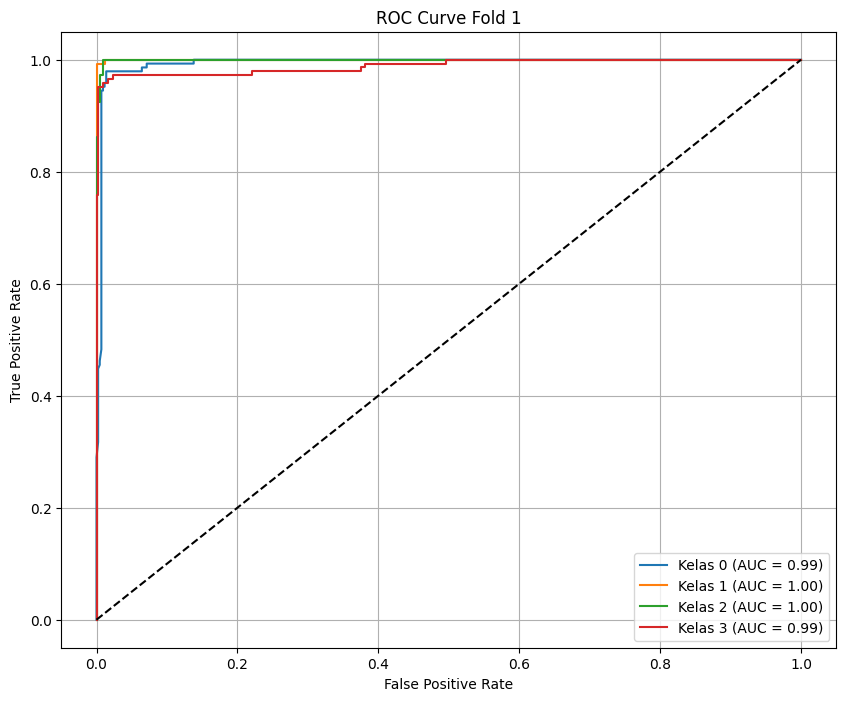




Evaluasi KFold 2 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step
Skor AUC (macro-average) untuk Fold 2: 0.9922


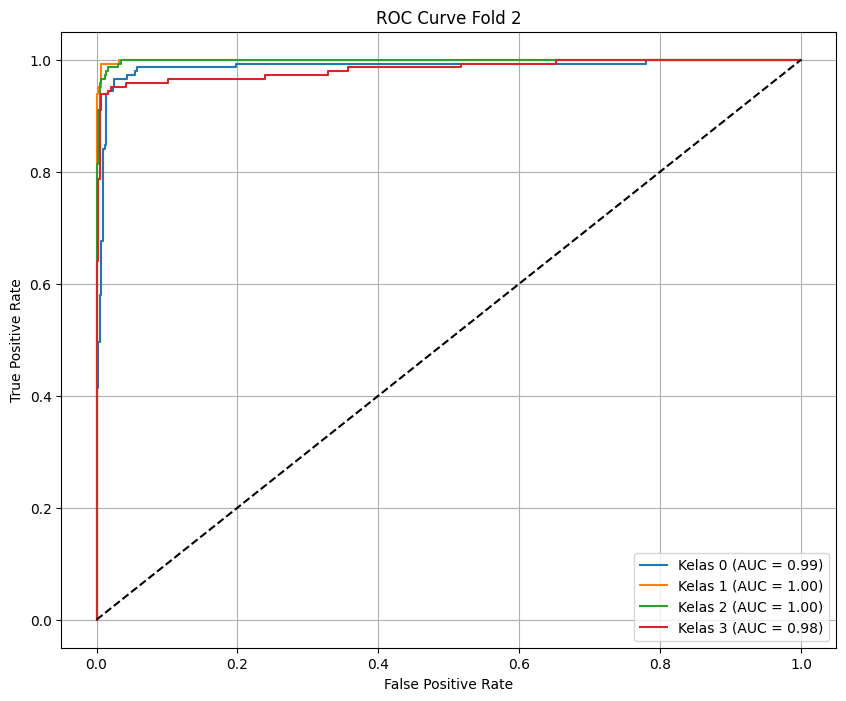




Evaluasi KFold 3 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 54s 3s/step
Skor AUC (macro-average) untuk Fold 3: 0.9954


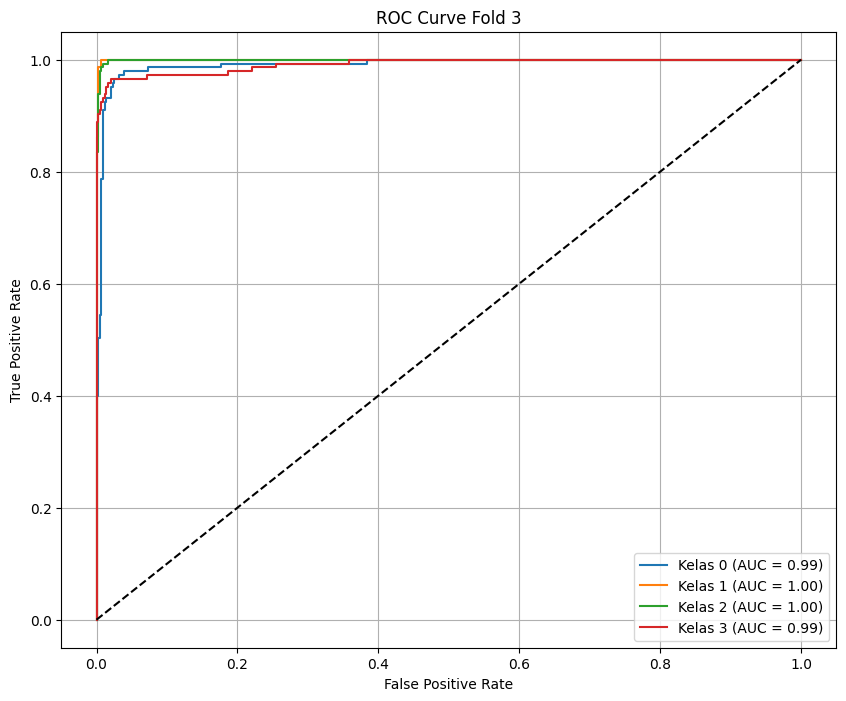




Evaluasi KFold 4 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 54s 3s/step
Skor AUC (macro-average) untuk Fold 4: 0.9959


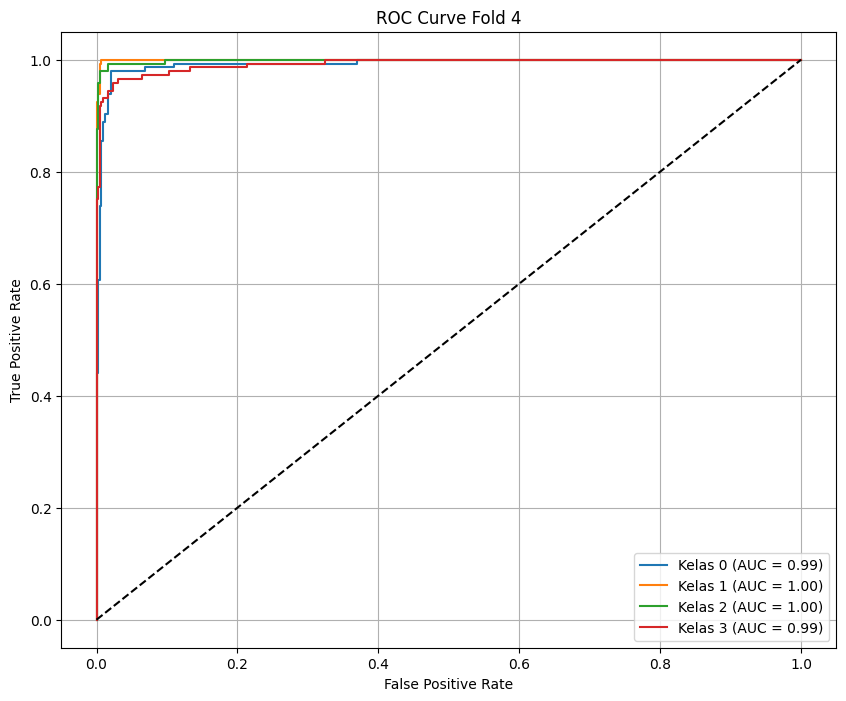




Evaluasi KFold 5 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 57s 3s/step
Skor AUC (macro-average) untuk Fold 5: 0.9951


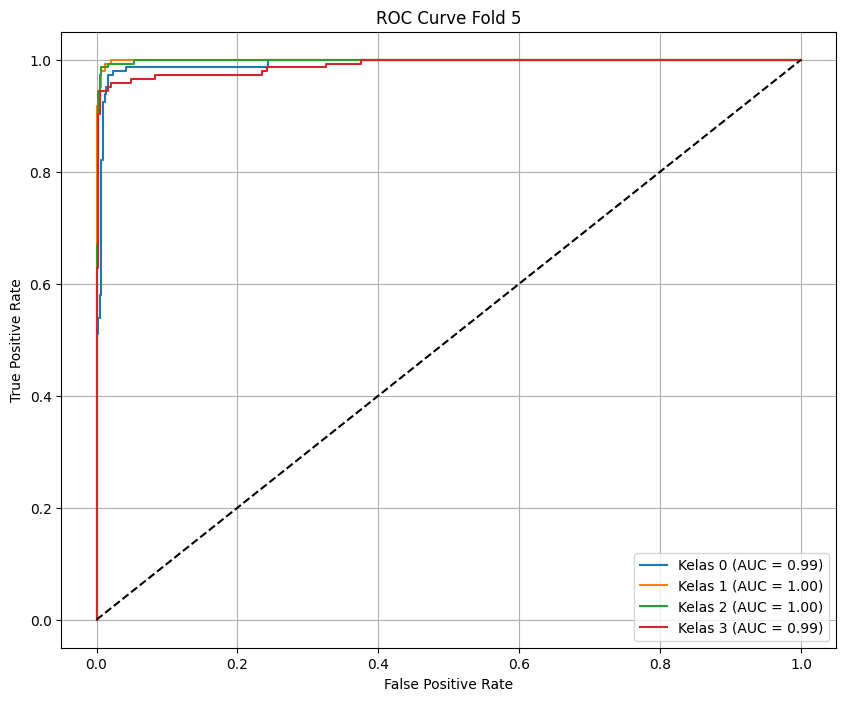

In [6]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize

def evaluate_model(fold_count, test_generator, model_path='./keras aug/elastic/elastic_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Evaluasi KFold {fold} ...")
        
        # Load model
        loaded_model = load_model(f'{model_path}{fold}.keras')

        # Prediksi pada data testing
        predictions = loaded_model.predict(test_generator)

        # Ambil label sebenarnya dari generator
        true_labels = test_generator.classes
        
        # Konversi label ke bentuk one-hot
        num_classes = predictions.shape[1]
        y_true = label_binarize(true_labels, classes=range(num_classes))
        
        # Hitung skor AUC macro
        auc_score = roc_auc_score(y_true, predictions, average='macro', multi_class='ovr')
        print(f"Skor AUC (macro-average) untuk Fold {fold}: {auc_score:.4f}")

        # Plot ROC Curve untuk setiap kelas
        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        for i in range(num_classes):
            fpr[i], tpr[i], _ = roc_curve(y_true[:, i], predictions[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot semua ROC dalam 1 grafik
        plt.figure(figsize=(10, 8))
        for i in range(num_classes):
            plt.plot(fpr[i], tpr[i], label=f'Kelas {i} (AUC = {roc_auc[i]:.2f})')

        plt.plot([0, 1], [0, 1], 'k--')  # Garis diagonal random guess
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve Fold {fold}')
        plt.legend(loc='lower right')
        plt.grid(True)
        plt.show()

evaluate_model(fold_count=5, test_generator=test_generator)